In [1]:
import matplotlib.pyplot as plt 
import numpy as np 
from scipy.fft import fft, ifft 
plt.rcParams['figure.dpi'] = 125 #Sætter opløsning af figurer

#Define constants and variables 
dx = 0.01
x = np.arange(-10,10+dx,0.01, dtype=np.complex64)

dt = 1*10**(-3)
ts = np.arange(0,10,dt, dtype=np.complex64)

hbar = 1
m = 1
w = 1
N = len(x) #skal være længden af x

dp = 2*np.pi/(N*dx)
pmax = N*dp/2
pl = -pmax

p = np.arange(pl,-pl,dp, dtype=np.complex64)

xl = -10  #det laveste x vi har

#Bølgefunktion:
# Harmonic oscillator: superposition af psi_0 og psi_1
psi_0 = (m*w/(np.pi*hbar))**(1/4)*np.exp(-m*w*x**2/(2*hbar))

#differentiere psi_0
diff = (m*w/(np.pi*hbar))**(1/4)*(-m*w*x*np.exp(-m*w*x**2/(2*hbar))/hbar)

#dermed kan psi_1 nu opskrives som:
psi_1 = 1/(np.sqrt(1))*(1/(np.sqrt(2*m*hbar*w))*(-1j*diff+1j*m*w*x*psi_0))
psi_x = 1/np.sqrt(2)*(psi_0 + psi_1)


n = np.arange(N)                                                       #der går måske noget galt her!!!!!

#Fast fourier transform: 
f=psi_x*np.exp(-1j*pl*xl)*np.exp(-1j*pl*dx*n)
f_tilde = fft(f)


#Den potentielle og kinetiske: 
T=p**2/(2*m)
V =1/2*m*w**2*x**2

C:\Users\laura\anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


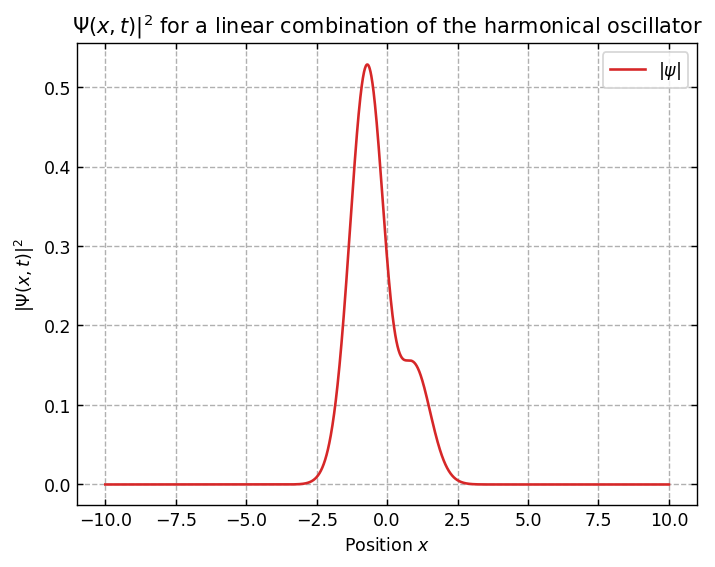

In [2]:
fig, axis = plt.subplots()

saved_steps = []

#loop hvor vi benytter andenordensudviklingen
for j,t in enumerate(ts): 
    f_tilde *= np.exp(-1j*dt*T/2)
    psi_x = ifft(f_tilde)
    psi_x *= np.exp(-1j*dt*V)
    f_tilde = fft(psi_x)                         
    f_tilde *= np.exp(-1j*dt*T/2)
    
    # Modulo
    if j % 100 == 0:
        saved_steps.append(ifft(f_tilde)*np.exp(1j*pl*xl)*np.exp(1j*pl*dx*n))

f = ifft(f_tilde)

psi_x_ny = f*np.exp(1j*pl*xl)*np.exp(1j*pl*dx*n) #"vender tilbage"

norm_psi = abs((psi_x_ny))**2       

#Plotter:
axis.plot(x,norm_psi, ls = '-', color = 'tab:red', label=r'$|\psi|$')
axis.grid(ls='--')
axis.set_xlabel('Position $x$')
axis.set_ylabel('$|\Psi(x,t)|^2$')
axis.set_title('$\Psi(x,t)|^2$ for a linear combination of the harmonical oscillator')
axis.tick_params(direction = 'in', top = True, right = True)

axis.legend()

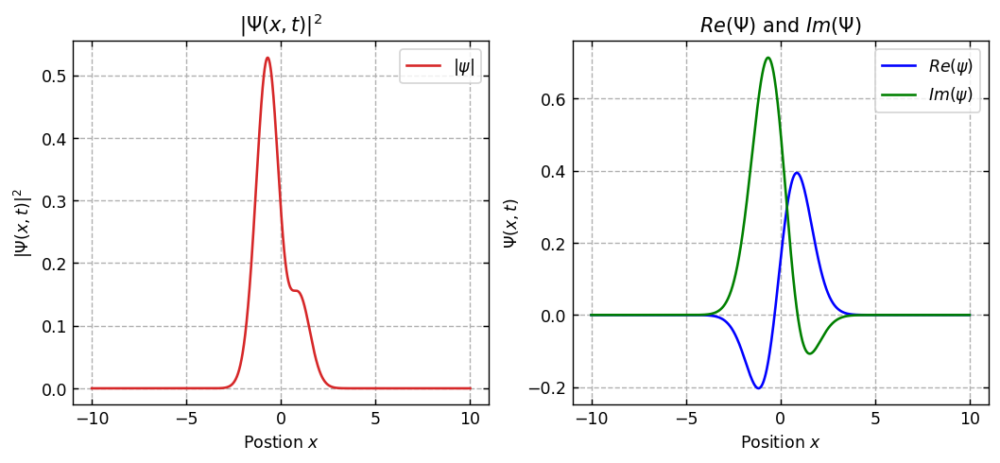

In [3]:
fig, ax1 = plt.subplots(1, 2, figsize=(10,4))

#Plotter:
plt.sca(ax1[0])
plt.plot(x,norm_psi, ls = '-', color = 'tab:red', label=r'$|\psi|$')
plt.grid(ls='--')
plt.xlabel('Postion $x$')
plt.ylabel('$|\Psi(x,t)|^2$')
plt.title('$|\Psi(x,t)|^2$')
plt.tick_params(direction = 'in', top = True, right = True)
plt.legend()

#real og imaginær
plt.sca(ax1[1])
real = np.real(psi_x_ny)
imag = np.imag(psi_x_ny)
plt.plot(x,real, color = 'blue', label = '$Re(\psi)$')
plt.plot(x,imag, color = 'green', label = '$Im(\psi)$')
plt.grid(ls='--')
plt.xlabel('Position $x$')
plt.ylabel('$\Psi(x,t)$')
plt.title('$Re(\Psi)$ and $Im(\Psi)$')
plt.tick_params(direction = 'in', top = True, right = True)
plt.legend()

C:\Users\laura\anaconda3\lib\site-packages\matplotlib\cbook\__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


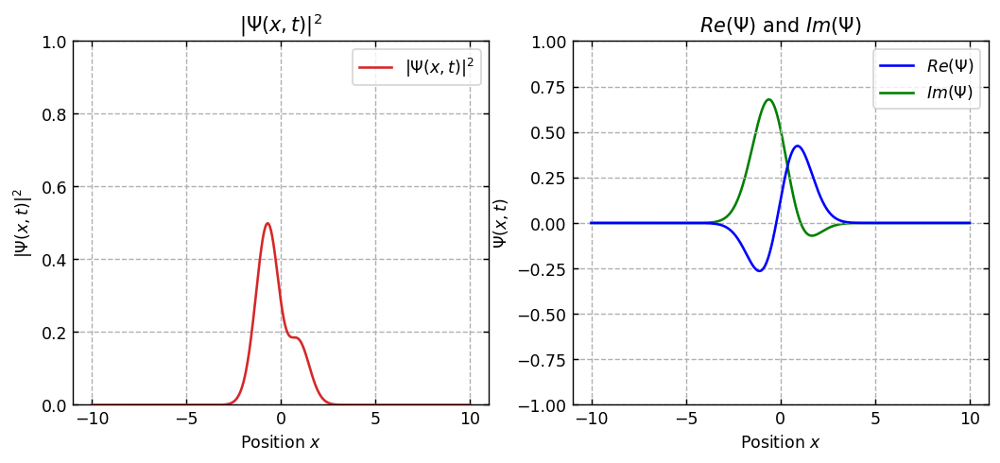

In [4]:
#Animation
fig, ax2 = plt.subplots(1, 2, figsize=(10,4))

plt.sca(ax2[0])
plt.grid(ls='--')
plt.xlabel('Position $x$')
plt.ylabel('$|\Psi(x,t)|^2$')
plt.title('$|\Psi(x,t)|^2$')
plt.tick_params(direction = 'in', top = True, right = True)
plt.ylim([0, 1])
line = plt.plot(x, norm_psi, ls = '-', color = 'tab:red', label = '$|\Psi(x,t)|^2$', zorder=3)
plt.legend()

plt.sca(ax2[1])
plt.grid(ls='--')
plt.xlabel('Position $x$')
plt.ylabel('$\Psi(x,t)$')
plt.title('$Re(\Psi)$ and $Im(\Psi)$')
plt.tick_params(direction = 'in', top = True, right = True)
plt.ylim([-1, 1])
linereal = plt.plot(x, real, ls = '-', color = 'blue', label = '$Re(\Psi)$', ms=2, zorder=2)
lineimag = plt.plot(x, imag, ls = '-', color = 'green', label = '$Im(\Psi)$', ms=2, zorder=1)
plt.legend()

def update(i):
    t = ts[i]
    y = abs(np.conj(saved_steps)[i]*saved_steps[i])
    linereal[0].set_data(x,np.real(saved_steps[i]))
    lineimag[0].set_data(x,np.imag(saved_steps[i]))
    line[0].set_data(x, y)
    return line[0], linereal[0], lineimag[0]

from matplotlib import animation
plt.rc('animation', html = 'jshtml')
N = len(saved_steps)

anim = animation.FuncAnimation(fig,
                               update,
                               frames=N,
                               interval=50,
                               blit=True)
anim

In [5]:
#Tjekker om den er normeret
np.trapz(abs(psi_x)**2, x)

(1.0000226049265013+0j)